# Chapter 7: Image Enhancement

## Point-wise intensity transformations – pixel transformation

In [2]:
%matplotlib inline
import numpy as np
from skimage import data, img_as_float, img_as_ubyte, exposure, io, color
from skimage.io import imread
from skimage.exposure import cumulative_distribution
from skimage.restoration import denoise_bilateral, denoise_nl_means, estimate_sigma
from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from skimage.util import random_noise
from skimage.color import rgb2gray
from PIL import Image, ImageEnhance, ImageFilter
from scipy import ndimage, misc
import cv2
import matplotlib
import matplotlib.pylab as plt
import warnings
warnings.filterwarnings('ignore')

In [14]:
def plot_image(image, title='', size=15):
    plt.title(title, size=size), plt.imshow(image, aspect='auto')
    plt.axis('off') # comment this line if you want axis ticks
    
def plot_hist(r, g, b, title=''):
    r, g, b = img_as_ubyte(r), img_as_ubyte(g), img_as_ubyte(b)
    plt.hist(np.array(r).ravel(), bins=256, range=(0, 256), color='r', alpha=0.5)
    plt.hist(np.array(g).ravel(), bins=256, range=(0, 256), color='g', alpha=0.5)
    plt.hist(np.array(b).ravel(), bins=256, range=(0, 256), color='b', alpha=0.5)
    plt.xlabel('pixel value', size=15), plt.ylabel('frequency', size=15)
    plt.title(title, size=15)

### Log transform

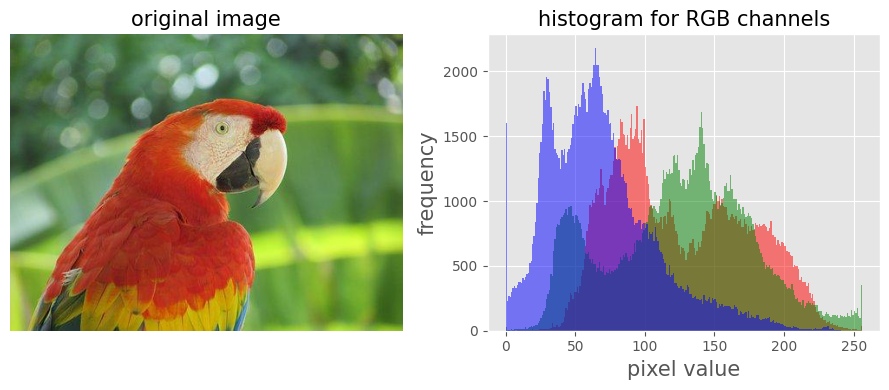

In [6]:
im = Image.open("images/parrot.jpg")
im_r, im_g, im_b = im.split()
plt.style.use('ggplot')
plt.figure(figsize=(9,4))
plt.subplot(121), plot_image(im, 'original image')
plt.subplot(122), plot_hist(im_r, im_g, im_b,'histogram for RGB channels')
plt.tight_layout()
plt.show()

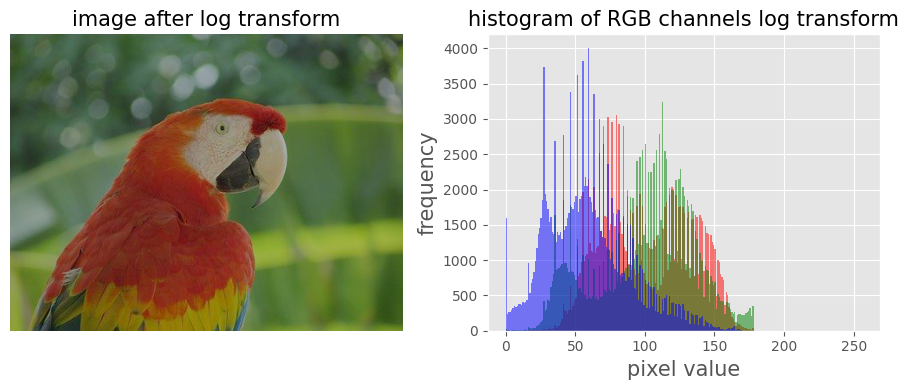

In [7]:
im = im.point(lambda i: 255*np.log(1+i/255))
im_r, im_g, im_b = im.split()
plt.style.use('ggplot')
plt.figure(figsize=(9,4))
plt.subplot(121), plot_image(im, 'image after log transform')
plt.subplot(122), plot_hist(im_r, im_g, im_b, 'histogram of RGB channels log transform')
plt.tight_layout()
plt.show()

### Power-law transform

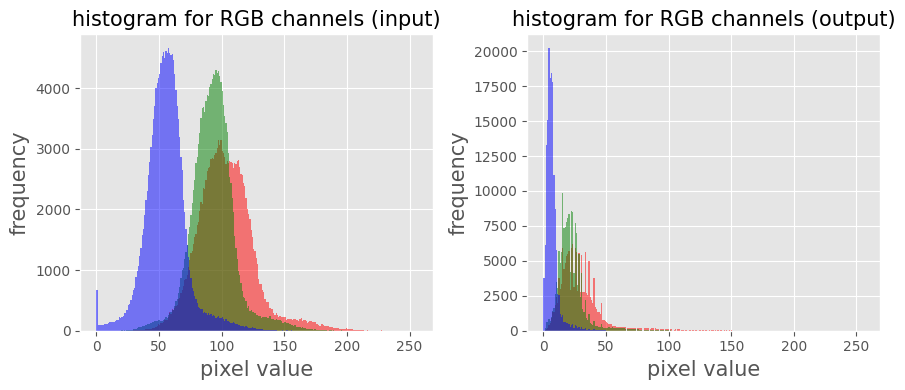

In [7]:
im = img_as_float(imread('images/cheetah.png'))
γ = 2.5
im1 = im**γ
plt.style.use('ggplot')
plt.figure(figsize=(9,4))
plt.subplot(121), plot_hist(im[...,0], im[...,1], im[...,2], 'histogram for RGB channels (input)')
plt.subplot(122), plot_hist(im1[...,0], im1[...,1], im1[...,2], 'histogram for RGB channels (output)')
plt.tight_layout()
plt.show()

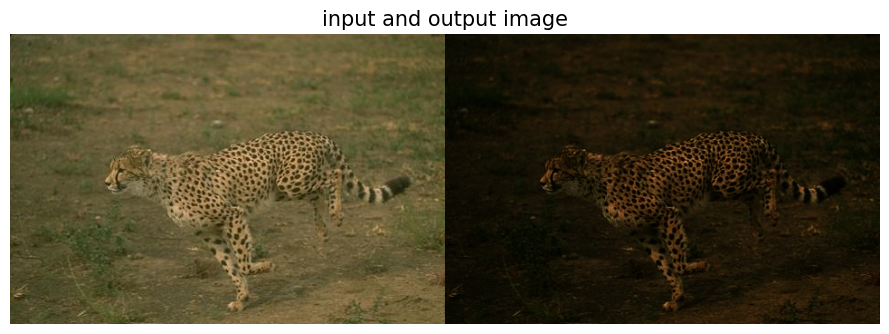

In [8]:
plt.figure(figsize=(9,4))
plt.imshow(np.hstack((im, im1))), plt.axis('off'), plt.title('input and output image', size=15)
plt.tight_layout()
plt.show()

## Brightness adjustment

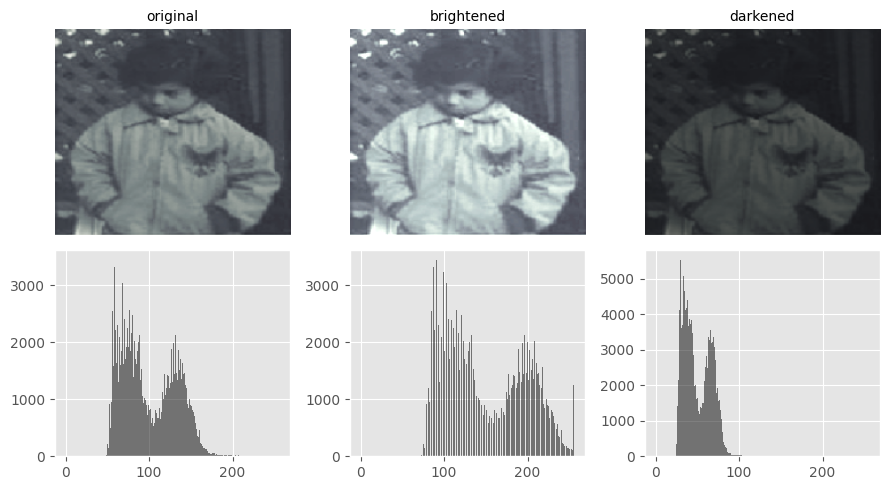

In [38]:
img = Image.open('images/boy.png')

enhancer = ImageEnhance.Brightness(img)
bright_img = enhancer.enhance(1.5)
dark_img = enhancer.enhance(0.5)

plt.style.use('ggplot')
plt.figure(figsize=(9,5))
plt.subplot(231), plot_image(img), plt.title('original', size=10)
plt.subplot(234), plt.hist(np.array(img).ravel(), bins=256, range=(0, 256), color='k', alpha=0.5)
plt.subplot(232), plot_image(bright_img), plt.title('brightened', size=10)
plt.subplot(235), plt.hist(np.array(bright_img).ravel(), bins=256, range=(0, 256), color='k', alpha=0.5)
plt.subplot(233), plot_image(dark_img), plt.title('darkened', size=10)
plt.subplot(236), plt.hist(np.array(dark_img).ravel(), bins=256, range=(0, 256), color='k', alpha=0.5)
plt.tight_layout()
plt.show()

### with opencv-python

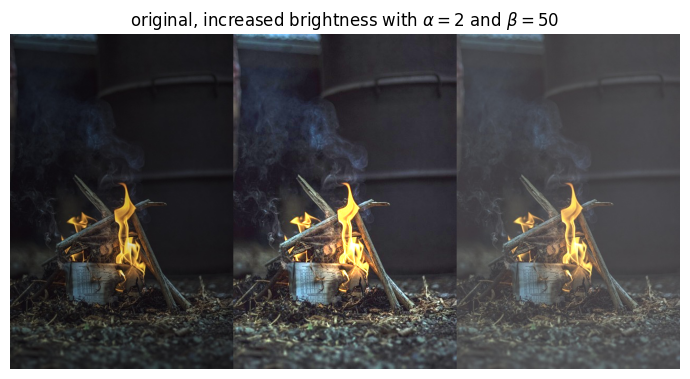

In [51]:
import numpy as np
import matplotlib.pyplot as plt

# Load image in RGB
img = cv2.cvtColor(cv2.imread("images/fire.jpg"), cv2.COLOR_BGR2RGB)

bright1 = cv2.convertScaleAbs(img, alpha=2, beta=0)
# Brightness increase by adding constant
bright2 = cv2.convertScaleAbs(img, alpha=1.0, beta=50)

plt.figure(figsize=(7,4))
plt.imshow(np.hstack((img, bright1, bright2))), plt.axis('off')
plt.title(r'original, increased brightness with $\alpha=2$ and $\beta=50$', size=12)
plt.tight_layout()

## Contrast Stretching

### Using `PIL` as a point operation

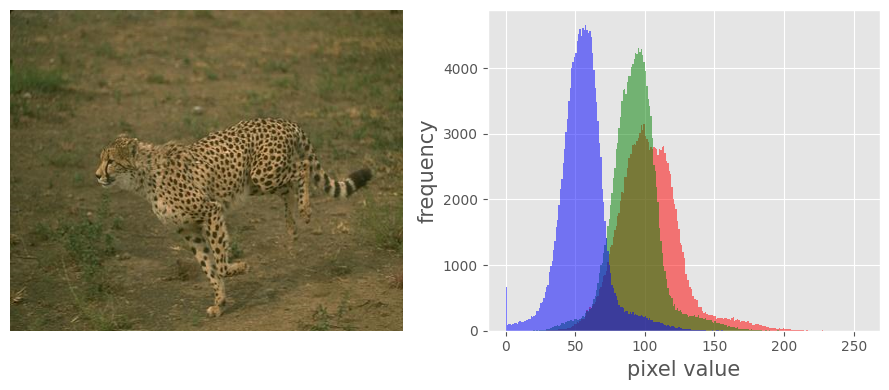

In [32]:
im = Image.open('images/cheetah.png')
im_r, im_g, im_b, _ = im.split()
plt.style.use('ggplot')
plt.figure(figsize=(9,4))
plt.subplot(121), plot_image(im)
plt.subplot(122), plot_hist(im_r, im_g, im_b)
plt.tight_layout()
plt.show()

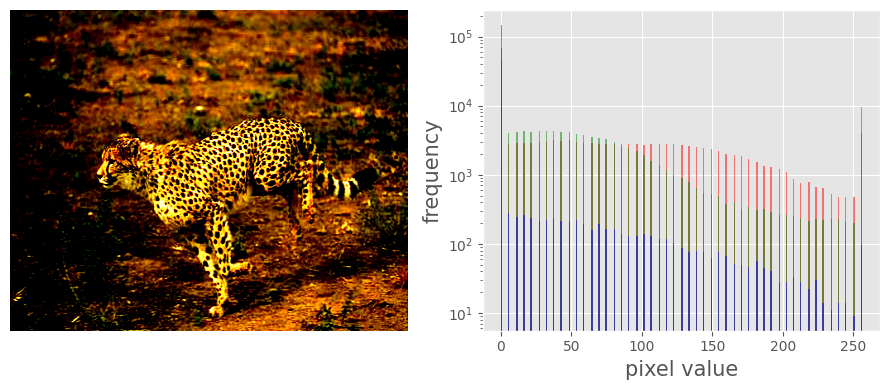

In [11]:
def contrast(c):
    return 0 if c < 70 else (255 if c > 150 else (255*c - 22950) / 48) # piece-wise linear function

im_contrast = im.point(contrast)
im_r, im_g, im_b, _ = im_contrast.split()
plt.style.use('ggplot')
plt.figure(figsize=(9,4))
plt.subplot(121), plot_image(im_contrast)
plt.subplot(122), plot_hist(im_r, im_g, im_b), plt.yscale('log')
plt.tight_layout()
plt.show()

### Using the `PIL.ImageEnhance` module

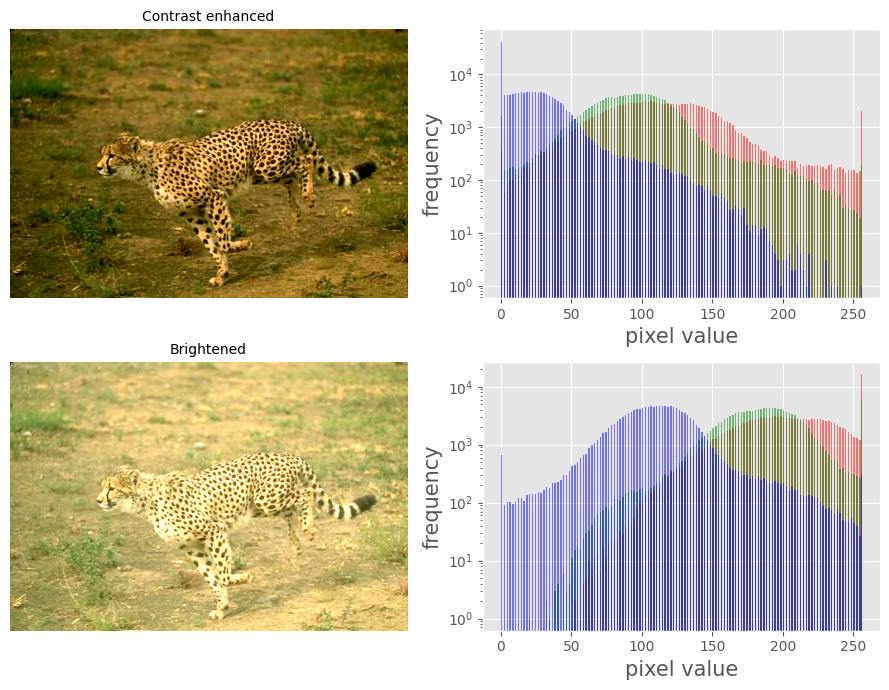

In [35]:
contrast = ImageEnhance.Contrast(im)
im_contrast = np.reshape(np.array(contrast.enhance(2).getdata()).astype(np.uint8), (im.height, im.width, 4)) 
im_bright = np.reshape(np.array(ImageEnhance.Brightness(im).enhance(2).getdata()).astype(np.uint8), (im.height, im.width, 4)) 
plt.style.use('ggplot')
plt.figure(figsize=(9,7))
plt.subplot(221), plot_image(im_contrast), plt.title('Contrast enhanced', size=10)
plt.subplot(222), plot_hist(im_contrast[...,0], im_contrast[...,1], im_contrast[...,2]), plt.yscale('log')
plt.subplot(223), plot_image(im_bright), plt.title('Brightened', size=10)
plt.subplot(224), plot_hist(im_bright[...,0], im_bright[...,1], im_bright[...,2]), plt.yscale('log')
plt.tight_layout()
plt.show()

## Thresholding

### Thresholding With a fixed threshold

In [ ]:
im = Image.open('images/swans.jpg').convert('L')
plt.hist(np.array(im).ravel(), bins=256, range=(0, 256), color='g')
plt.xlabel('pixel values'), plt.ylabel('Frequency'),
plt.title('Histogram of pixel values')
plt.show()
plt.figure(figsize=(8,12))
plt.gray()
plt.subplot(221), plot_image(im, 'original image'), plt.axis('off')
th = [0, 50, 100, 150, 200]
for i in range(2, 5):
    im1 = im.point(lambda x: x > th[i])
    plt.subplot(2,2,i), plot_image(im1, 'binary image with threshold=' + str(th[i]))
plt.tight_layout()
plt.show()

##  Stochastic Halftoning

In [ ]:
im = Image.open('images/swans.jpg').convert('L')
im = Image.fromarray(np.clip(im + np.random.randint(-128, 128, (im.height, im.width)), 0, 255).astype(np.uint8))
plt.figure(figsize=(8,12))
plt.subplot(221), plot_image(im, 'original image (with noise)')
th = [0, 50, 100, 150, 200]
for i in range(2, 5):
    im1 = im.point(lambda x: x > th[i])
    plt.subplot(2,2,i), plot_image(im1, 'binary image with threshold=' +   str(th[i]))
plt.tight_layout()
plt.show()

## Floyd-Steinberg Dithering with Error Diffusion

Unique gray levels in output: [  0 255] (count: 2)
Unique gray levels in output: [  0  85 170 255] (count: 4)


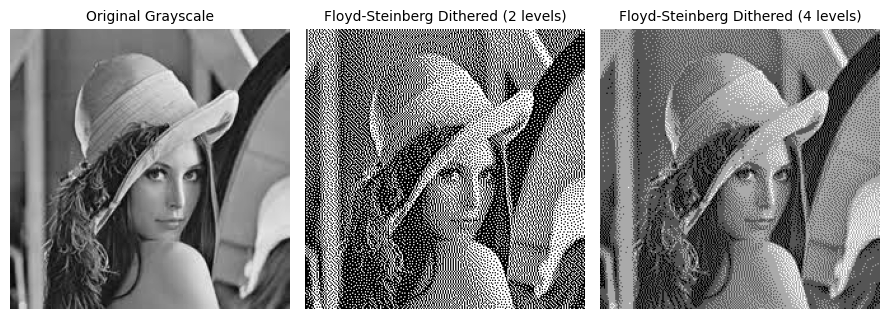

In [102]:
import numpy as np
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pyplot as plt

def find_closest_palette_color(old_pixel, num_colors=2):
    step = 255 / (num_colors - 1)
    return np.round(old_pixel / step) * step

def get_dithered_image(image, num_colors):
    dithered = np.copy(image)
    h, w = dithered.shape
    # Floyd-Steinberg Dithering
    for x in range(h):
        for y in range(w):
            old_pixel = dithered[x, y]
            new_pixel = find_closest_palette_color(old_pixel, num_colors)
            dithered[x, y] = new_pixel
            quant_error = old_pixel - new_pixel
    
            if y + 1 < w:
                dithered[x, y + 1] += quant_error * 7 / 16
            if x + 1 < h and y > 0:
                dithered[x + 1, y - 1] += quant_error * 3 / 16
            if x + 1 < h:
                dithered[x + 1, y] += quant_error * 5 / 16
            if x + 1 < h and y + 1 < w:
                dithered[x + 1, y + 1] += quant_error * 1 / 16
    # Final quantization to ensure exact gray levels
    dithered = find_closest_palette_color(dithered, num_colors)
    dithered = np.clip(dithered, 0, 255).astype(np.uint8)
    # Verify number of distinct levels
    unique_values = np.unique(dithered)
    print(f"Unique gray levels in output: {unique_values} (count: {len(unique_values)})")
    
    return dithered
    
# Load and normalize grayscale image
image = rgb2gray(imread('images/lena.jpg')[...,:3])
image = image * 255
image = image.astype(np.float32)

#num_colors = 4  # e.g., 2 = binary, 4 = 4 gray levels (0, 85, 170, 255)
dithered2 = get_dithered_image(image, 2)
dithered4 = get_dithered_image(image, 4)

# Display
plt.figure(figsize=(9, 5))
plt.subplot(131)
plt.title("Original Grayscale", size=10)
plt.imshow(image, cmap='gray'), plt.axis('off')
plt.subplot(132)
plt.title(f"Floyd-Steinberg Dithered (2 levels)", size=10)
plt.imshow(dithered2, cmap='gray'), plt.axis('off')
plt.subplot(133)
plt.title(f"Floyd-Steinberg Dithered (4 levels)", size=10)
plt.imshow(dithered4, cmap='gray'), plt.axis('off')
plt.tight_layout()
plt.show()

Unique gray levels in output: [  0 255] (count: 2)
Unique gray levels in output: [  0 255] (count: 2)
Unique gray levels in output: [  0 255] (count: 2)
Unique gray levels in output: [  0  85 170 255] (count: 4)
Unique gray levels in output: [  0  85 170 255] (count: 4)
Unique gray levels in output: [  0  85 170 255] (count: 4)


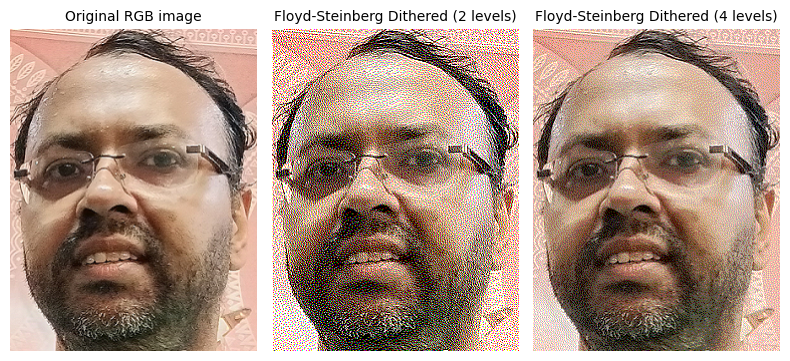

In [103]:
image = imread('images/me.png')[...,:3]
image = image / image.max() * 255
image = image.astype(np.float32)

dithered2 = np.zeros_like(image)
for i in range(3):
    dithered2[...,i] = get_dithered_image(image[...,i], 2)
dithered4 = np.zeros_like(image)
for i in range(3):
    dithered4[...,i] = get_dithered_image(image[...,i], 4)

# Display
plt.figure(figsize=(8, 4))
plt.subplot(131)
plt.title("Original RGB image", size=10)
plt.imshow(image.astype('uint8')), plt.axis('off')
plt.subplot(132)
plt.title(f"Floyd-Steinberg Dithered (2 levels)", size=10)
plt.imshow(dithered2.astype('uint8')), plt.axis('off')
plt.subplot(133)
plt.title(f"Floyd-Steinberg Dithered (4 levels)", size=10)
plt.imshow(dithered4.astype('uint8')), plt.axis('off')
plt.tight_layout()
plt.show()

## Histogram processing – Histogram Modification, Equalization and Matching

## Histogram Modification

0 84


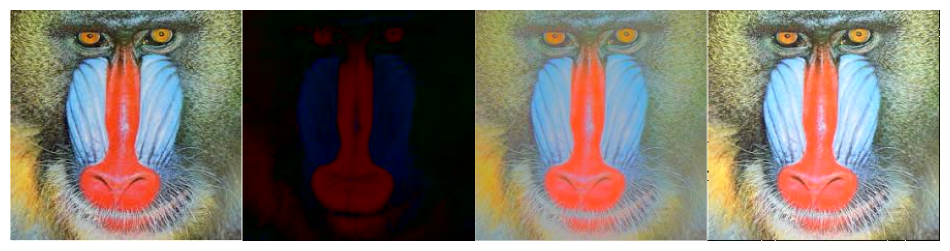

In [63]:
import cv2
import numpy as np

def histogram_stretching(image):
    # Compute the minimum and maximum intensity values
    min_val, max_val = np.min(image), np.max(image)
    # Stretch the histogram
    stretched = 255 * (image - min_val) / (max_val - min_val)
    return stretched.astype(np.uint8)

def histogram_shrinking(image, target_range=(100, 200)):
    min_val, max_val = np.min(image), np.max(image)
    # Shrink the histogram
    shrunk = (image - min_val) / (max_val - min_val) * (target_range[1] - target_range[0]) + target_range[0]
    return shrunk.astype(np.uint8)

def histogram_sliding(image, shift_value=30):
    # Slide the histogram
    slid = np.clip(image + shift_value, 0, 255)
    return slid.astype(np.uint8)

# Example usage
#image = plt.imread('images/mandrill.jpg')
image = cv2.imread('images/mandrill.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

stretched_image = image.copy()
shrunk_image = image.copy()
slid_image = image.copy()

#for i in range(3):
i = 0
stretched_image[...,i] = histogram_stretching(stretched_image[...,i])
shrunk_image[...,i] = histogram_shrinking(shrunk_image[...,i])
slid_image[...,i] = histogram_sliding(slid_image[...,i])

image = cv2.cvtColor(image, cv2.COLOR_LAB2RGB)
stretched_image = cv2.cvtColor(stretched_image, cv2.COLOR_LAB2RGB)
shrunk_image = cv2.cvtColor(shrunk_image, cv2.COLOR_LAB2RGB)
slid_image = cv2.cvtColor(slid_image, cv2.COLOR_LAB2RGB)
print(stretched_image.min(), stretched_image.max())

plt.figure(figsize=(12,4))
plt.imshow(np.hstack((image, stretched_image, shrunk_image, slid_image))), plt.axis('off')
plt.show()

### Contrast Stretching and Histogram Equalization with `scikit-image`

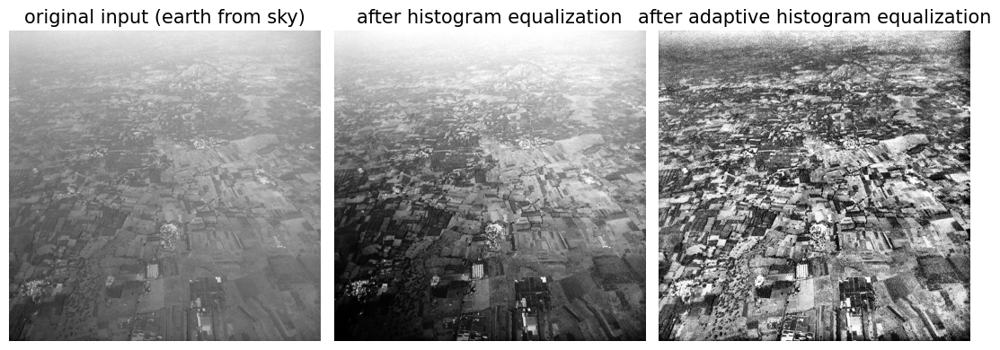

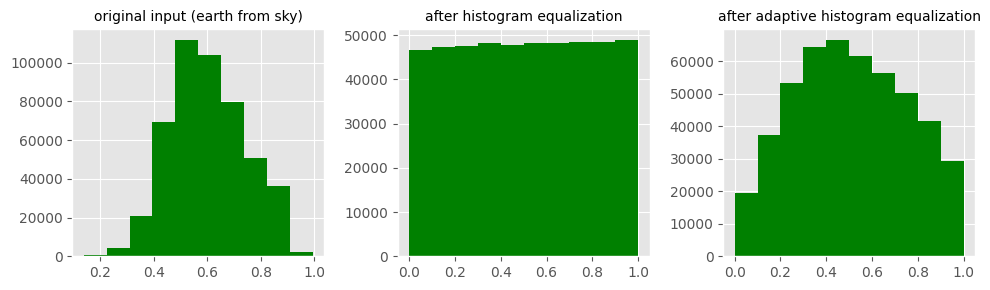

In [105]:
img = rgb2gray(imread('images/earthfromsky.jpg'))
# histogram equalization
img_eq = exposure.equalize_hist(img)
# adaptive histogram equalization
img_adapteq = exposure.equalize_adapthist(img, clip_limit=0.03)
images = [img, img_eq, img_adapteq]
titles = ['original input (earth from sky)', 'after histogram equalization', 'after adaptive histogram equalization']
plt.figure(figsize=(11,4))
for i in range(3):
    plt.subplot(1,3,i+1), plot_image(images[i], titles[i])
plt.tight_layout()
plt.show()
plt.figure(figsize=(10,3))
plt.gray()
for i in range(3):
    plt.subplot(1,3,i+1), plt.hist(images[i].ravel(), color='g'), plt.title(titles[i], size=10)
plt.tight_layout()
plt.show()

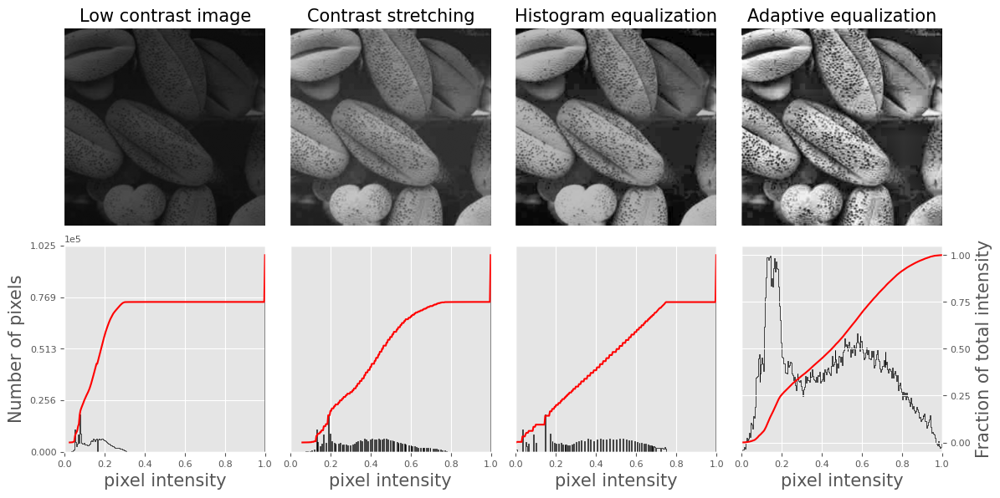

In [106]:
def plot_image_and_hist(image, axes, bins=256):
    image = img_as_float(image)
    axes_image, axes_hist = axes
    axes_cdf = axes_hist.twinx()
    axes_image.imshow(image, cmap=plt.cm.gray)
    axes_image.set_axis_off()
    axes_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    axes_hist.set_xlim(0, 1)
    axes_hist.set_xlabel('pixel intensity', size=15)
    axes_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    axes_hist.set_yticks([])
    image_cdf, bins = exposure.cumulative_distribution(image, bins)
    axes_cdf.plot(bins, image_cdf, 'r')
    axes_cdf.set_yticks([])
    return axes_image, axes_hist, axes_cdf

im = io.imread('images/beans_g.png')
# contrast stretching
im_rescale = exposure.rescale_intensity(im, in_range=(0, 100), out_range=(0, 255))
im_rescale = im_rescale.astype(np.uint8)
im_eq = exposure.equalize_hist(im) # histogram equalization
im_adapteq = exposure.equalize_adapthist(im, clip_limit=0.03) # adaptive histogram equalization

matplotlib.rcParams['font.size'] = 8

fig = plt.figure(figsize=(12, 6))
axes = np.zeros((2, 4), dtype = 'object')
axes[0, 0] = fig.add_subplot(2, 4, 1)
for i in range(1, 4):
    axes[0, i] = fig.add_subplot(2, 4, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 4):
    axes[1, i] = fig.add_subplot(2, 4, 5+i)
axes_image, axes_hist, axes_cdf = plot_image_and_hist(im, axes[:, 0])
axes_image.set_title('Low contrast image', size=15)
y_min, y_max = axes_hist.get_ylim()
axes_hist.set_ylabel('Number of pixels', size=15)
axes_hist.set_yticks(np.linspace(0, y_max, 5))
axes_image, axes_hist, axes_cdf = plot_image_and_hist(im_rescale, axes[:,1])
axes_image.set_title('Contrast stretching', size=15)
axes_image, axes_hist, axes_cdf = plot_image_and_hist(im_eq, axes[:, 2])
axes_image.set_title('Histogram equalization', size=15)
axes_image, axes_hist, axes_cdf = plot_image_and_hist(im_adapteq, axes[:,3])
axes_image.set_title('Adaptive equalization', size=15)
axes_cdf.set_ylabel('Fraction of total intensity', size=15)
axes_cdf.set_yticks(np.linspace(0, 1, 5))
fig.tight_layout()
plt.show()

The above figure shows the output of the previous code snippet. As can be seen, adaptive
histogram equalization provides better results than histogram equalization in terms of making the details of the output image clearer. Using the low-contrast colored cheetah input image instead, the previous code produces
the following output:

![](images/cheetah_hist_eq.png)

## Contrast Enhancement Using Fuzzy Logic with Mamdani System

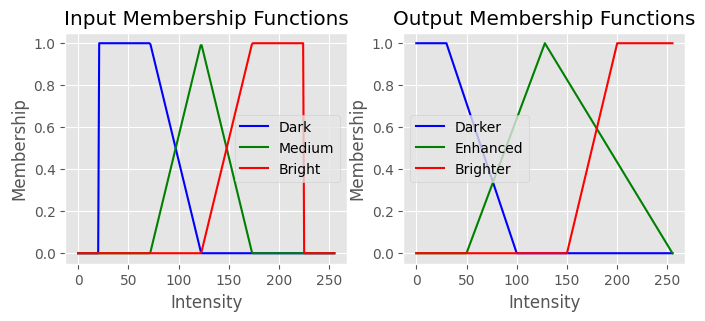

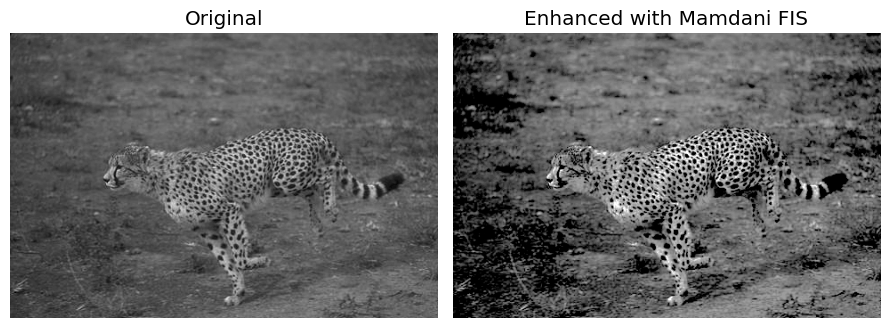

In [100]:
import cv2
import numpy as np
import skfuzzy as fuzz
import matplotlib.pyplot as plt

def fuzzy_enhance_pixel(value):
    # Fuzzification
    dark_level = fuzz.interp_membership(x, input_dark, value)
    medium_level = fuzz.interp_membership(x, input_medium, value)
    bright_level = fuzz.interp_membership(x, input_bright, value)

    # Rule-based inference using Mamdani min-max composition
    rule_darker = np.fmin(dark_level, output_darker)
    rule_enhanced = np.fmin(medium_level, output_enhanced)
    rule_brighter = np.fmin(bright_level, output_brighter)

    # Aggregate all rules (max)
    aggregated = np.fmax(rule_darker, np.fmax(rule_enhanced, rule_brighter))

    # Defuzzification (centroid)
    return fuzz.defuzz(x, aggregated, 'centroid')

def fuzzy_image_enhancement(img_gray):
    img_out = np.zeros_like(img_gray, dtype=np.uint8)
    h, w = img_gray.shape
    for i in range(h):
        for j in range(w):
            pixel = img_gray[i, j]
            enhanced_val = fuzzy_enhance_pixel(pixel)
            img_out[i, j] = np.clip(enhanced_val, 0, 255)
    return img_out

# Load grayscale image
img_path = "images/cheetah.png"
img_gray = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
img_min, img_max = int(np.min(img_gray)), int(np.max(img_gray))

# Create fuzzy membership functions for input and output
x = np.arange(0, 256, 1)

# Calculate key points for fuzzy input MFs
range_width = img_max - img_min
low = img_min + 0.25 * range_width
mid = img_min + 0.5 * range_width
high = img_min + 0.75 * range_width

# Input fuzzy sets dynamically based on image intensity range
input_dark = fuzz.trapmf(x, [img_min, img_min, low, mid])
input_medium = fuzz.trimf(x, [low, mid, high])
input_bright = fuzz.trapmf(x, [mid, high, img_max, img_max])

# Output fuzzy sets (contrast enhancement)
output_darker = fuzz.trapmf(x, [0, 0, 30, 100])
output_enhanced = fuzz.trimf(x, [50, 128, 255])
output_brighter = fuzz.trapmf(x, [150, 200, 255, 255])

plt.figure(figsize=(8, 3))
plt.subplot(121), plt.plot(x, input_dark, label='Dark', color='blue')
plt.plot(x, input_medium, label='Medium', color='green'), plt.plot(x, input_bright, label='Bright', color='red')
plt.title('Input Membership Functions'), plt.xlabel('Intensity'), plt.ylabel('Membership'), plt.grid(True), plt.legend()

plt.subplot(122), plt.plot(x, output_darker, label='Darker', color='blue')
plt.plot(x, output_enhanced, label='Enhanced', color='green'), plt.plot(x, output_brighter, label='Brighter', color='red')
plt.title('Output Membership Functions'), plt.xlabel('Intensity'), plt.ylabel('Membership'), plt.grid(True), plt.legend()

# Apply fuzzy enhancement
img_fuzzy = fuzzy_image_enhancement(img_gray)

# Display results
plt.figure(figsize=(9, 4))
plt.subplot(121), plt.imshow(img_gray, cmap='gray'), plt.axis("off"), plt.title("Original")
plt.subplot(122), plt.imshow(img_fuzzy, cmap='gray'), plt.axis("off"), plt.title("Enhanced with Mamdani FIS")
plt.tight_layout()
plt.show()

## Histogram Matching

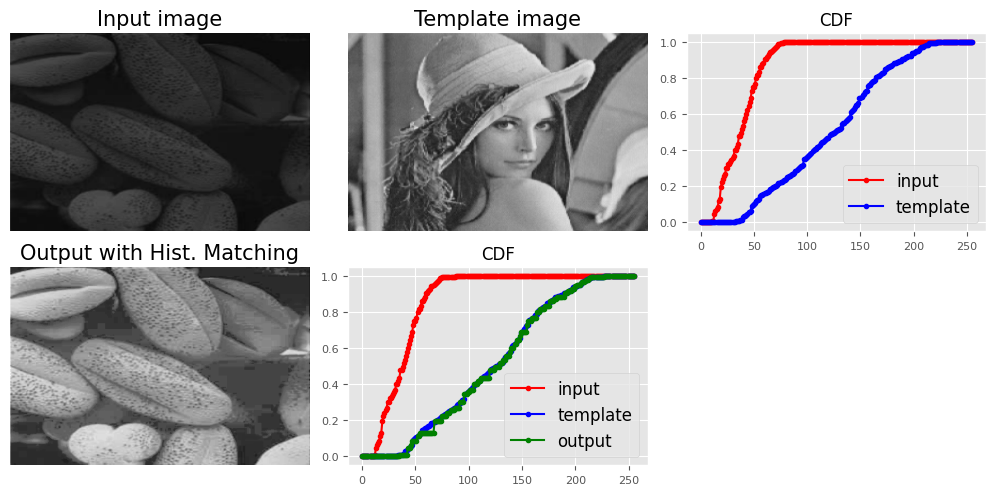

In [109]:
def cdf(im):
    '''
    computes the CDF of an image im as 2D numpy ndarray
    '''
    c, b = cumulative_distribution(im)
    # pad the beginning and ending pixels and their CDF values
    c = np.insert(c, 0, [0]*b[0])
    c = np.append(c, [1]*(255-b[-1]))
    return c

def hist_matching(c, c_t, im):
    '''
    c: CDF of input image computed with the function cdf()
    c_t: CDF of template image computed with the function cdf()
    im: input image as 2D numpy ndarray
    returns the modified pixel values for the input image
    '''
    pixels = np.arange(256)
    # find closest pixel-matches corresponding to the CDF of the input image, given the value of the CDF H of
    # the template image at the corresponding pixels, s.t. c_t = H(pixels) <=> pixels = H-1(c_t)
    new_pixels = np.interp(c, c_t, pixels)
    im_out = (np.reshape(new_pixels[im.ravel()], im.shape)).astype(np.uint8)
    return im_out

def plot_image(image, title=''):
    plt.title(title, size=15), plt.imshow(image, vmin=0, vmax=255, aspect='auto')
    plt.axis('off') # comment this line if you want axis ticks    

im = (rgb2gray(imread('images/beans_g.png')[...,:3])*255).astype(np.uint8)
im_t = (rgb2gray(imread('images/lena_g.png'))*255).astype(np.uint8)
plt.figure(figsize=(10,5))
plt.gray()
plt.subplot(231), plot_image(im, 'Input image')
plt.subplot(232), plot_image(im_t, 'Template image')
c, c_t = cdf(im), cdf(im_t)
p = np.arange(256)
plt.subplot(233), plt.plot(p, c, 'r.-', label='input'), plt.plot(p, c_t, 'b.-', label='template')
plt.legend(prop={'size': 12}), plt.title('CDF', size=12)
im_out = hist_matching(c, c_t, im)
plt.subplot(234), plot_image(im_out, 'Output with Hist. Matching')
c1 = cdf(im_out)
plt.subplot(235), plt.plot(np.arange(256), c, 'r.-', label='input')
plt.plot(np.arange(256), c_t, 'b.-', label='template'), plt.plot(np.arange(256), c1, 'g.-', label='output')
plt.legend(prop={'size': 12}), plt.title('CDF', size=12)
plt.tight_layout()
plt.show()

### Histogram matching for an RGB image

![](images/hist_match_col.png)  

## with scikit-image

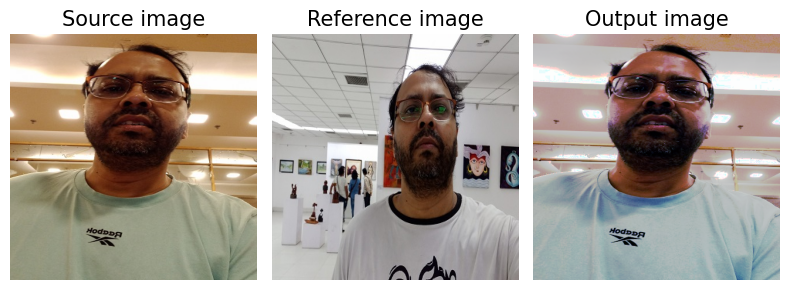

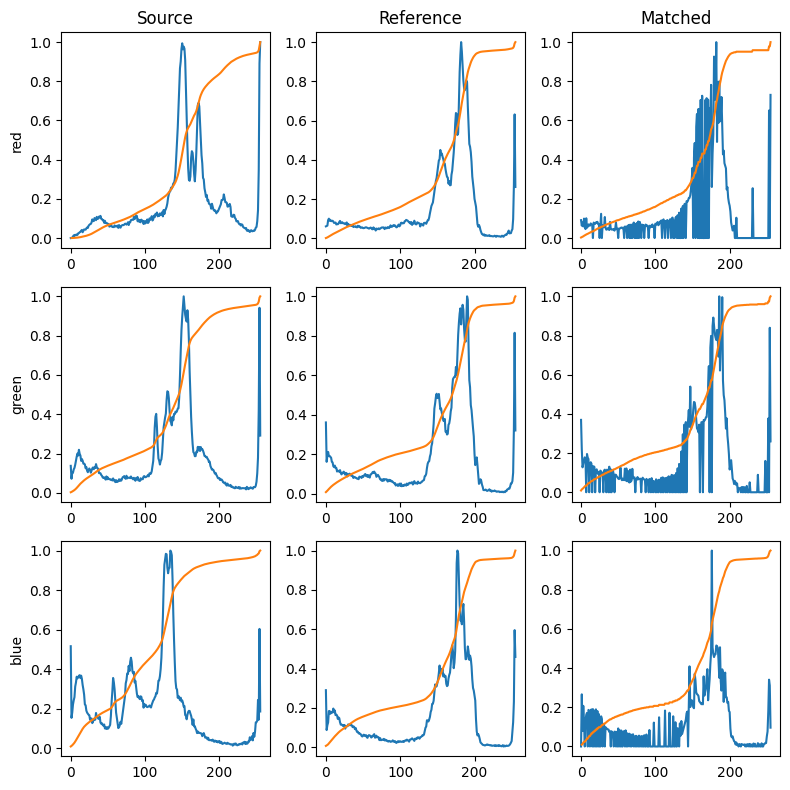

In [23]:
from skimage.exposure import match_histograms, histogram, cumulative_distribution
from skimage.io import imread

def plot_image(image, title=''):
    plt.title(title, size=15), plt.imshow(image, aspect='auto')
    plt.axis('off') # comment this line if you want axis ticks

# Read source and reference images
source = imread('images/me_mall.jpg')[...,:3]       # Image to correct 
reference = imread('images/me_gallery.jpg')[...,:3]  # Image with desired color profile 
# Match histograms across RGB channels
matched = match_histograms(source, reference, channel_axis=-1)
matched = np.clip(matched, 0, 255).astype(np.uint8)

plt.figure(figsize=(8,3))
plt.gray()
plt.subplot(131), plot_image(source, 'Source image')
plt.subplot(132), plot_image(reference, 'Reference image')
plt.subplot(133), plot_image(matched, 'Output image')
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(8, 8))
for i, img in enumerate((source, reference, matched)):
    for c, c_color in enumerate(('red', 'green', 'blue')):
        img_hist, bins = histogram(img[..., c], source_range='dtype')
        axes[c, i].plot(bins, img_hist / img_hist.max())
        img_cdf, bins = cumulative_distribution(img[..., c])
        axes[c, i].plot(bins, img_cdf)
        axes[c, 0].set_ylabel(c_color)
axes[0, 0].set_title('Source')
axes[0, 1].set_title('Reference')
axes[0, 2].set_title('Matched')
plt.tight_layout()
plt.show()

##  Enhancements in Colors

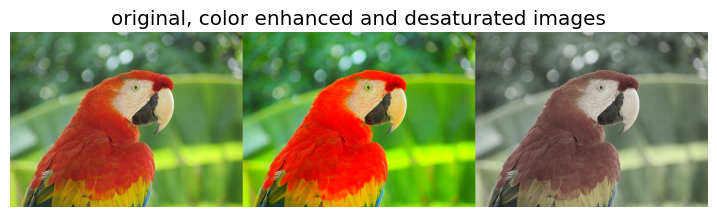

In [85]:
img = Image.open("images/parrot.jpg")
enhancer = ImageEnhance.Color(img)
colorful = enhancer.enhance(1.8)
desaturated = enhancer.enhance(0.3)
plt.figure(figsize=(9,4))
plt.imshow(np.hstack((img, colorful, desaturated))), plt.axis('off')
plt.title('original, color enhanced and desaturated images');

### Color Correction with white balance algorithms

In [ ]:
from skimage.io import imread

# white balance for every channel independently
def white_balance(channel, perc = 0.05):
    mi, ma = (np.percentile(channel, perc), np.percentile(channel,100.0-perc))
    channel = np.uint8(np.clip((channel-mi)*255.0/(ma-mi), 0, 255))
    return channel

image = imread("images/flowers.png")[...,:3] # load color
balanced  = np.dstack([white_balance(channel, 0.05) for channel in cv2.split(image)] )
plt.figure(figsize=(7,4))
plt.imshow(np.hstack((image, balanced))), plt.axis('off'), plt.title('original and white-balanced image', size=10)
plt.tight_layout()
plt.show()

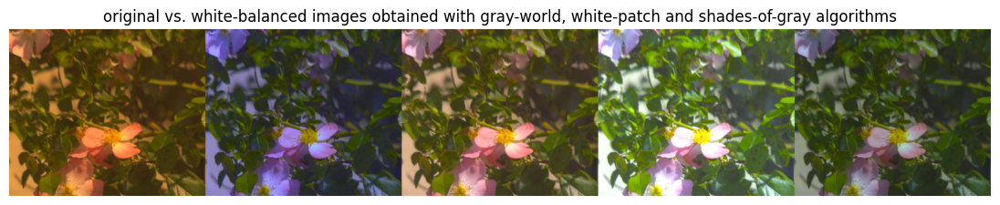

In [111]:
def gray_world(img):
    img = img.astype(np.float32)
    avg_rgb = np.mean(img, axis=(0, 1))
    avg_gray = np.mean(avg_rgb)
    scale = avg_gray / avg_rgb
    balanced = img * scale
    balanced = np.clip(balanced, 0, 255).astype(np.uint8)
    return balanced

def white_patch(img):
    img = img.astype(np.float32)
    max_rgb = np.max(img, axis=(0, 1))
    scale = 255 / max_rgb
    balanced = img * scale
    balanced = np.clip(balanced, 0, 255).astype(np.uint8)
    return balanced

def white_patch_percentile(img, percentile=95):
    img = img.astype(np.float32)
    scale = 255 / np.percentile(img, percentile, axis=(0, 1))
    balanced = img * scale
    balanced = np.clip(balanced, 0, 255).astype(np.uint8)
    return balanced
    
def shades_of_gray(img, p=6):
    img = img.astype(np.float32)
    rgb_power = np.power(img, p)
    mean_power = np.mean(rgb_power, axis=(0, 1))
    illuminant = np.power(mean_power, 1/p)
    scale = np.mean(illuminant) / illuminant
    balanced = img * scale
    balanced = np.clip(balanced, 0, 255).astype(np.uint8)
    return balanced

plt.figure(figsize=(11,4))
plt.imshow(np.hstack((image, gray_world(image), white_patch(image), white_patch_percentile(image), shades_of_gray(image)))), plt.axis('off')
plt.title('original vs. white-balanced images obtained with gray-world, white-patch and shades-of-gray algorithms', size=12)
plt.tight_layout()

## Linear noise smoothing

### Smoothing with PIL

### Smoothing with ImageFilter.BLUR

In [ ]:
i = 1
plt.figure(figsize=(8,10))
for prop_noise in np.linspace(0.05,0.3,3):
    im = Image.open('images/mandrill.jpg')
    # choose 5000 random locations inside image
    n = int(im.width * im.height * prop_noise)
    x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height, n)
    for (x,y) in zip(x,y):
        im.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # generate salt-and-pepper noise
    im.save('images/mandrill_spnoise_' + str(prop_noise) + '.jpg')
    plt.subplot(3,2,i), plot_image(im, 'Original Image with ' +
    str(int(100*prop_noise)) + '% added noise')
    i += 1
    im1 = im.filter(ImageFilter.BLUR)
    plt.subplot(3,2,i), plot_image(im1, 'Blurred Image')
    i += 1
plt.tight_layout()
plt.show()

### Smoothing by averaging with the box blur kernel

In [ ]:
im = Image.open('images/mandrill_spnoise_0.1.jpg')
plt.figure(figsize=(10,4))
plt.subplot(1,3,1), plt.imshow(im), plt.title('Original Image', size=15), plt.axis('off')
for n in [3,5]:
    box_blur_kernel = np.reshape(np.ones(n*n),(n,n)) / (n*n)
    im1 = im.filter(ImageFilter.Kernel((n,n), box_blur_kernel.flatten()))
    plt.subplot(1,3,(2 if n==3 else 3))
    plot_image(im1, 'Blurred with kernel size = ' + str(n) + 'x' + str(n))
plt.suptitle('PIL Mean Filter (Box Blur) with different Kernel size', size=18)
plt.tight_layout()
plt.show()

### Smoothing with the Gaussian blur filter

In [ ]:
im = Image.open('images/mandrill_spnoise_0.2.jpg')
plt.figure(figsize=(10,4))
i = 1
for radius in range(1, 4):
    im1 = im.filter(ImageFilter.GaussianBlur(radius))
    plt.subplot(1,3,i), plot_image(im1, 'radius = ' +
    str(round(radius,2)))
    i += 1
plt.suptitle('PIL Gaussian Blur with different Radius', size=20)
plt.tight_layout()
plt.show()

### Comparing smoothing with box and Gaussian kernels using `scipy.ndimage`

In [ ]:
im = plt.imread('images/mandrill_spnoise_0.1.jpg')
k = 7 # 7x7 kernel
im_box = ndimage.uniform_filter(im, size=(k,k,1))
s = 2 # sigma value
t = (((k - 1)/2)-0.5)/s # truncate parameter value for a kxk gaussian kernel with sigma s
im_gaussian = ndimage.gaussian_filter(im, sigma=(s,s,0), truncate=t)
fig = plt.figure(figsize=(20,10))
plt.subplot(131), plot_image(im, 'original image')
plt.subplot(132), plot_image(im_box, 'with the box filter')
plt.subplot(133), plot_image(im_gaussian, 'with the gaussian filter')
plt.tight_layout()
plt.show()

### Nonlinear noise smoothing

### Smoothing with PIL

### Using the median filter

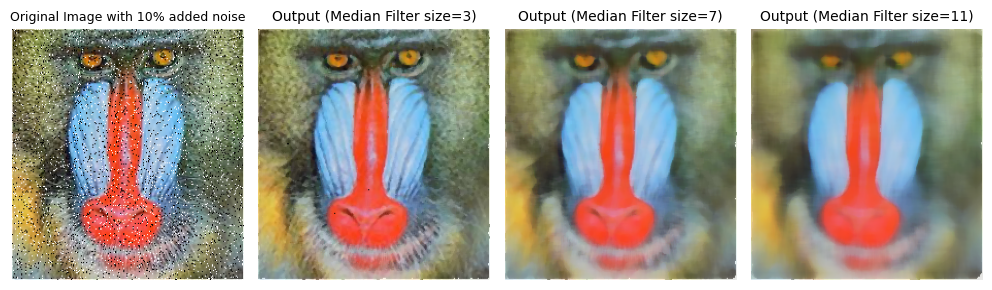

In [29]:
prop_noise = 0.1
im = Image.open('images/mandrill.jpg')
# choose 5000 random locations inside image
n = int(im.width * im.height * prop_noise)
x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height, n)
for (x,y) in zip(x,y):
    im.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # geenrate salt-and-pepper noise
im.save('images/mandrill_spnoise_' + str(prop_noise) + '.jpg')

plt.figure(figsize=(10,3))
plt.subplot(141), plot_image(im, 'Original Image with ' + str(int(100*prop_noise)) + '% added noise', size=9)
i = 2
for sz in [3,7,11]:
    im1 = im.filter(ImageFilter.MedianFilter(size=sz))
    plt.subplot(1,4,i), plot_image(im1, title='Output (Median Filter size=' +  str(sz) + ')', size=10)
    i += 1
plt.tight_layout()
plt.show()

### Using mode filter

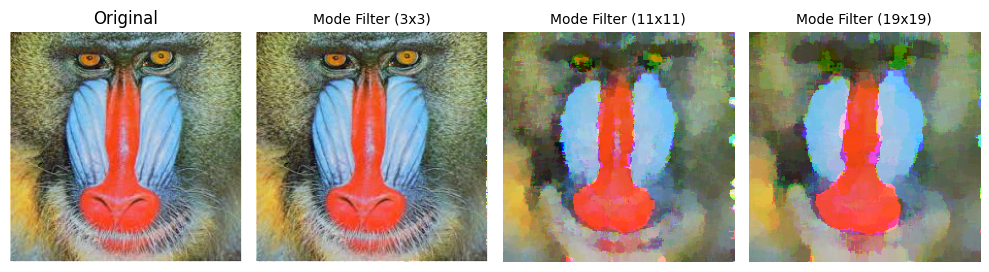

In [101]:
img = Image.open('images/mandrill.jpg')

# Define filter sizes to compare
filter_sizes = [3, 11, 19]

# Initialize figure
fig, axes = plt.subplots(1, len(filter_sizes) + 1, figsize=(10, 5))

# Show original image
axes[0].imshow(img, cmap='gray')
axes[0].set_title("Original")
axes[0].axis('off')

# Apply and display mode filters of varying sizes
for i, size in enumerate(filter_sizes):
    filtered_img = img.filter(ImageFilter.ModeFilter(size=size))
    axes[i + 1].imshow(filtered_img, cmap='gray')
    axes[i + 1].set_title(f"Mode Filter ({size}x{size})", size=10)
    axes[i + 1].axis('off')

plt.tight_layout()
plt.show()

### Using max and min filter

In [ ]:
im = Image.open('images/mandrill_spnoise_0.1.jpg')
sz = 3
plt.figure(figsize=(20,8))
plt.subplot(131), plot_image(im, 'Original Image with 10% added noise')
im1 = im.filter(ImageFilter.MaxFilter(size=sz))
plt.subplot(132), plot_image(im1, 'Output (Max Filter size=' + str(sz)+ ')')
im1 = im1.filter(ImageFilter.MinFilter(size=sz))
plt.subplot(133), plot_image(im1, 'Output (Min Filter size=' + str(sz)+ ')')
plt.tight_layout()
plt.show()

## Smoothing (denoising) with scikit-image


### Using the bilateral filter

In [ ]:
im = color.rgb2gray(img_as_float(io.imread('images/mountain.png')))
sigma = 0.155
noisy = random_noise(im, var=sigma**2)
plt.gray(), plt.imshow(noisy), plt.axis('off')
plt.show()

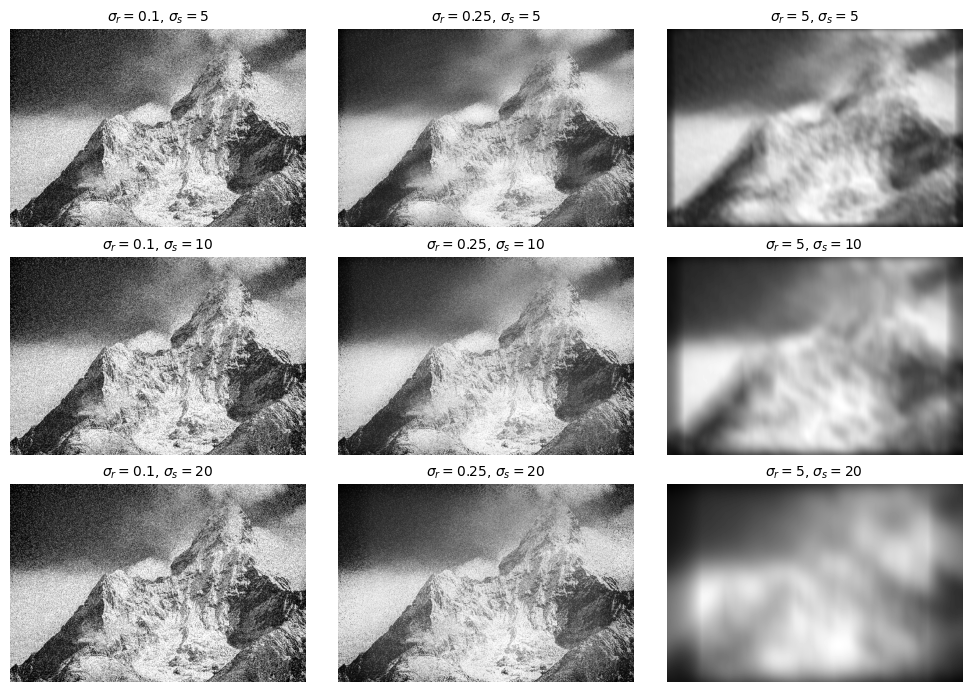

In [18]:
plt.figure(figsize=(10,7))
i = 1
for sigma_sp in [5, 10, 20]:
    for sigma_col in [0.1, 0.25, 5]:
        plt.subplot(3,3,i)
        plt.imshow(denoise_bilateral(noisy, sigma_color=sigma_col, sigma_spatial=sigma_sp, channel_axis=None)), plt.axis('off')
        plt.title(r'$\sigma_r=$' + str(sigma_col) + r', $\sigma_s=$' + str(sigma_sp), size=10)
        i += 1
plt.tight_layout()
plt.show()

### Using non-local means

estimated noise standard deviation = 0.21997787904679203
PSNR (noisy) = 13.03
PSNR (slow) = 25.97
PSNR (fast) = 26.18


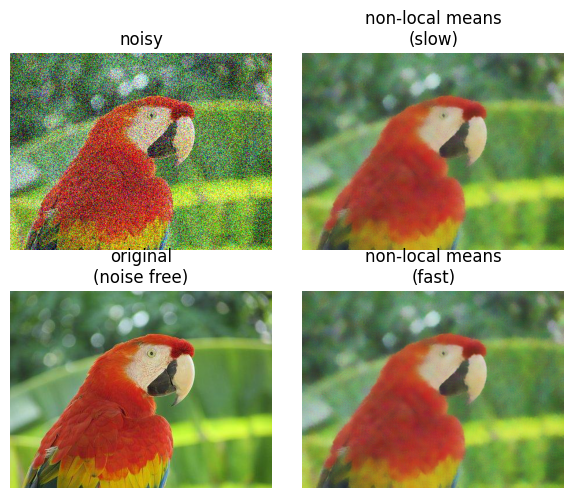

In [21]:
def plot_image_axes(image, axes, title):
    axes.imshow(image)
    axes.axis('off')
    axes.set_title(title, size=12)
    
parrot = img_as_float(imread('images/parrot.jpg'))
sigma = 0.25
noisy = parrot + sigma * np.random.standard_normal(parrot.shape)
noisy = np.clip(noisy, 0, 1)
# estimate the noise standard deviation from the noisy image
sigma_est = np.mean(estimate_sigma(noisy, channel_axis=-1))
print("estimated noise standard deviation = {}".format(sigma_est))
# estimated noise standard deviation = 0.22048519002358943
patch_kw = dict(patch_size=5, # 5x5 patches
                patch_distance=6, # 13x13 search area
                channel_axis=-1)
# slow algorithm
denoise = denoise_nl_means(noisy, h=1.15 * sigma_est, fast_mode=False, **patch_kw)
# fast algorithm
denoise_fast = denoise_nl_means(noisy, h=0.8 * sigma_est, fast_mode=True, **patch_kw)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(6, 5), sharex=True, sharey=True)
plot_image_axes(noisy, axes[0, 0], 'noisy')
plot_image_axes(denoise, axes[0, 1], 'non-local means\n(slow)')
plot_image_axes(parrot, axes[1, 0], 'original\n(noise free)')
plot_image_axes(denoise_fast, axes[1, 1], 'non-local means\n(fast)')
fig.tight_layout()
# PSNR metric values
psnr_noisy = compare_psnr(parrot, noisy)
psnr = compare_psnr(parrot, denoise.astype(np.float64))
psnr_fast = compare_psnr(parrot, denoise_fast.astype(np.float64))
print("PSNR (noisy) = {:0.2f}".format(psnr_noisy))
print("PSNR (slow) = {:0.2f}".format(psnr))
print("PSNR (fast) = {:0.2f}".format(psnr_fast))
# PSNR (noisy) = 13.04 # PSNR (slow) = 26.25 # PSNR (fast) = 25.84
plt.show()

### Smoothing with `scipy.ndimage`

In [32]:
lena = imread('images/lena.jpg')
# add salt-and-pepper noise to the input image
noise = np.random.random(lena.shape)
lena[noise > 0.9] = 255
lena[noise < 0.1] = 0

In [ ]:
plot_image(lena, 'noisy image')
plt.show()
fig = plt.figure(figsize=(20,15))
i = 1
for p in range(25, 100, 25):
    for k in range(5, 25, 5):
        plt.subplot(3,4,i)
        filtered = ndimage.percentile_filter(lena, percentile=p, size=(k,k,1))
        plot_image(filtered, str(p) + ' percentile, ' + str(k) + 'x' + str(k) + ' kernel')
        i += 1
plt.show()

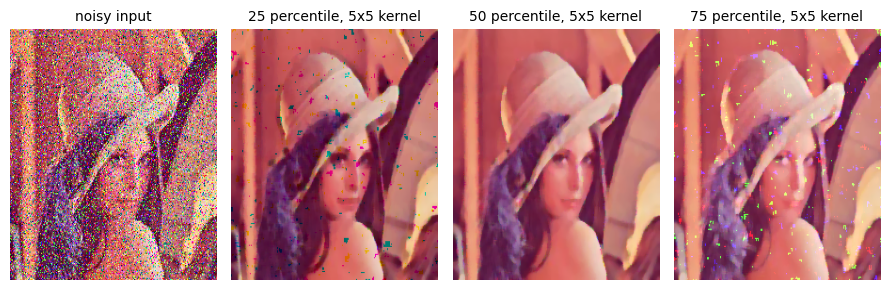

In [37]:
k = 5
i = 2
fig = plt.figure(figsize=(9,3))
plt.subplot(141), plot_image(lena, 'noisy input')
for p in range(25, 100, 25):
    plt.subplot(1,4,i)
    filtered = ndimage.percentile_filter(lena, percentile=p, size=(k,k,1))
    plot_image(filtered, str(p) + ' percentile, ' + str(k) + 'x' + str(k) + ' kernel')
    i += 1
plt.tight_layout()
plt.show()

## Interactive Image Enhancement App using Streamlit and image-enhancement 

In [ ]:
! python -m streamlit run app.py
# A browser will be opened with url localhost:8502

<div class="row">
<img src="images/app1.png" width="500"/>
<img src="images/app2.png" width="500"/>
</div>
<div class="row">
<img src="images/app3.png" width="500"/>
<img src="images/app4.png" width="500"/>
</div>

![](images/app_scr_cap.gif)

## Denoising with BM3D

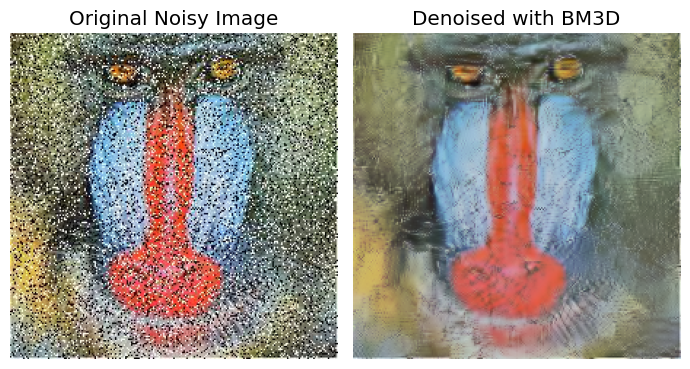

In [25]:
#!pip install bm3d

import bm3d
import cv2
from skimage import io, img_as_float
import matplotlib.pyplot as plt

# Load a noisy image
image_path = 'images/mandrill_spnoise_0.3.jpg'
noisy_image = img_as_float(io.imread(image_path)) #, as_gray=True))

# Apply BM3D denoising
denoised = bm3d.bm3d(noisy_image, sigma_psd=0.2, stage_arg=bm3d.BM3DStages.ALL_STAGES)

# Display the results
plt.figure(figsize=(7, 4))
plt.subplot(121), plt.imshow(noisy_image, cmap='gray'), plt.title('Original Noisy Image'), plt.axis('off')
plt.subplot(122), plt.imshow(denoised, cmap='gray'), plt.title('Denoised with BM3D'), plt.axis('off')
plt.tight_layout()
plt.show()

Sigma_psd: 0.05, PSNR: 21.95, SSIM: 0.4385
Sigma_psd: 0.075, PSNR: 28.26, SSIM: 0.7637
Sigma_psd: 0.1, PSNR: 29.83, SSIM: 0.8240
Sigma_psd: 0.125, PSNR: 29.29, SSIM: 0.7925
Sigma_psd: 0.15, PSNR: 28.98, SSIM: 0.7777


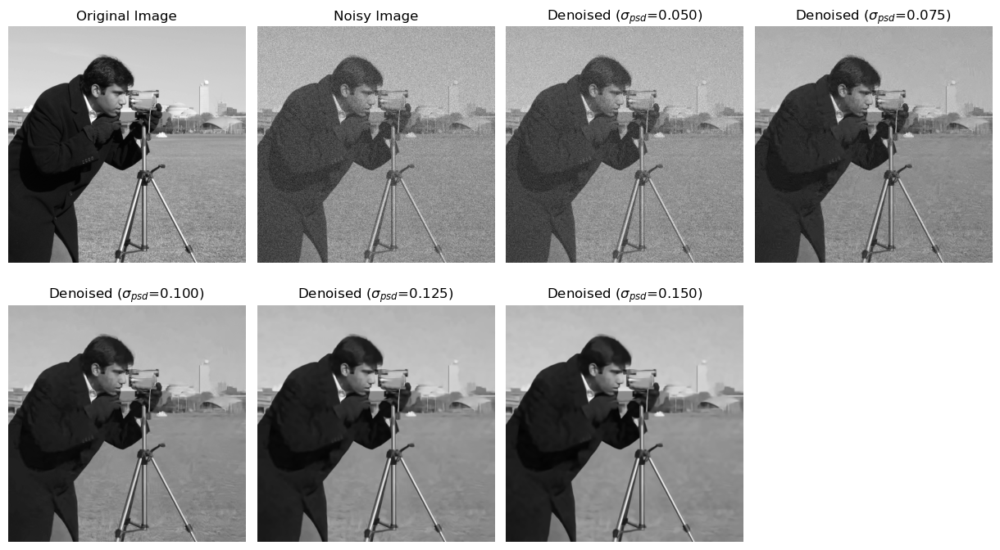

In [20]:
import bm3d
import numpy as np
from skimage import metrics, data, img_as_float
import matplotlib.pyplot as plt

# Load or generate a noisy image
original_image = img_as_float(data.camera())  # Example clean image
noise_std = 0.1  # Standard deviation of the noise
noisy_image = original_image + noise_std * np.random.randn(*original_image.shape)

# Range of sigma_psd values to test
sigma_values = np.linspace(0.05, 0.15, 5)

# Function to evaluate denoising performance
def evaluate_denoising_performance(original, denoised):
    psnr_value = metrics.peak_signal_noise_ratio(original, denoised)
    ssim_value = metrics.structural_similarity(original, denoised, data_range=denoised.max()-denoised.min()) #, channel_axis=2)
    return psnr_value, ssim_value

# Optionally, visualize the best-performing denoised image
plt.figure(figsize=(12, 7))
plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
plt.subplot(241), plt.imshow(original_image, cmap='gray'), plt.title('Original Image'), plt.axis('off')
plt.subplot(242), plt.imshow(noisy_image, cmap='gray'), plt.title('Noisy Image'), plt.axis('off')
# Test different sigma_psd values
i = 3
for sigma_psd in sigma_values:
    denoised_image = bm3d.bm3d(noisy_image, sigma_psd=sigma_psd, stage_arg=bm3d.BM3DStages.ALL_STAGES)
    psnr, ssim = evaluate_denoising_performance(original_image, denoised_image)
    print(f"Sigma_psd: {sigma_psd}, PSNR: {psnr:.2f}, SSIM: {ssim:.4f}")
    # Assuming the last sigma_psd value gives the best result for demonstration
    plt.subplot(2,4,i), plt.imshow(denoised_image, cmap='gray'), plt.title(r'Denoised ($\sigma_{psd}$=' + f'{sigma_psd:.03f})'), plt.axis('off')
    i += 1
plt.show()

In [13]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

def evaluate_denoising_performance(original, denoised):
    psnr_value = psnr(original, denoised, data_range=denoised.max() - denoised.min())
    ssim_value = ssim(original, denoised, data_range=denoised.max() - denoised.min(), channel_axis=2)    
    return psnr_value, ssim_value

original = img_as_float(io.imread('images/mandrill.jpg'))
# Assuming `original_images` and `denoised_images` are lists of images
psnr_value, ssim_value = evaluate_denoising_performance(original, denoised)
print(f"PSNR: {psnr_value}, SSIM: {ssim_value}")

PSNR: 19.572008112856363, SSIM: 0.42267909385403984


## Image Fusion with Wavelets

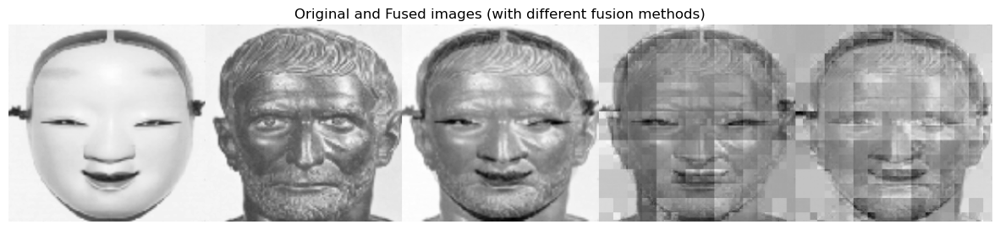

In [28]:
import pywt
import cv2
import numpy as np
import matplotlib.pylab as plt

# This function does the coefficient fusing according to the fusion method
def fuse_coefficients(coeff1, coeff2, method='mean'):
    if method == 'mean':
        return (coeff1 + coeff2) / 2
    elif method == 'min':
        return np.minimum(coeff1, coeff2)
    elif method == 'max':
        return np.maximum(coeff1, coeff2)
    else:
        raise ValueError("Unsupported fusion method")

def fuse_images(im1, im2, fusion_method, wavelet='db1'): # Daubechies wavelet
    
    # Resize im2 to match im1 if needed
    im2 = cv2.resize(im2, (im1.shape[1], im1.shape[0]))
    
    # Wavelet decomposition
    coeffs1 = pywt.wavedec2(im1, wavelet)
    coeffs2 = pywt.wavedec2(im2, wavelet)
    
    # Fuse wavelet coefficients
    fused_coeffs = []
    for i in range(len(coeffs1)):
        if i == 0:
            # Approximation coefficients
            fused_coeffs.append(fuse_coefficients(coeffs1[0], coeffs2[0], fusion_method))
        else:
            # Detail coefficients (horizontal, vertical, diagonal)
            c1 = fuse_coefficients(coeffs1[i][0], coeffs2[i][0], fusion_method)
            c2 = fuse_coefficients(coeffs1[i][1], coeffs2[i][1], fusion_method)
            c3 = fuse_coefficients(coeffs1[i][2], coeffs2[i][2], fusion_method)
            fused_coeffs.append((c1, c2, c3))
    
    # Reconstruct fused image
    fused_image = pywt.waverec2(fused_coeffs, wavelet)
    # Normalize to 8-bit range
    fused_image = 255 * (fused_image - fused_image.min()) / (fused_image.max() - fused_image.min())
    return fused_image.astype(np.uint8)

# Load grayscale input images
im1 = cv2.imread('images/mask.png', cv2.IMREAD_GRAYSCALE)
im2 = cv2.imread('images/dust.png', cv2.IMREAD_GRAYSCALE)

# Fith: Show image
plt.figure(figsize=(15,5))
plt.gray()
plt.imshow(np.hstack((im1, im2,  \
                      cv2.resize(fuse_images(im1, im2, 'mean'), (im1.shape[1], im1.shape[0])),
                      cv2.resize(fuse_images(im1, im2, 'max'), (im1.shape[1], im1.shape[0])),
                      cv2.resize(fuse_images(im1, im2, 'min'), (im1.shape[1], im1.shape[0])),
                     )))
plt.title('Original and Fused images (with different fusion methods)')
plt.axis('off');

## Low-Light Image Enhancement with Zero-Reference Deep Curve Estimation (Zero-DCE) model

In [ ]:
import torch, torchvision
import torch.nn as nn
from pathlib import Path
from PIL import Image
import numpy as np
import matplotlib.pylab as plt

class DCENet(nn.Module):
    '''https://li-chongyi.github.io/Proj_Zero-DCE.html'''

    def __init__(self, n=8, return_results=[4, 6, 8]):
        '''
        Args
        --------
          n: number of iterations of LE(x) = LE(x) + alpha * LE(x) * (1-LE(x)).
          return_results: [4, 8] => return the 4-th and 8-th iteration results.
        '''
        super().__init__()
        self.n = n
        self.ret = return_results

        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1, bias=True)
        self.conv2 = nn.Conv2d(32, 32, kernel_size=3, padding=1, bias=True)
        self.conv3 = nn.Conv2d(32, 32, kernel_size=3, padding=1, bias=True)
        self.conv4 = nn.Conv2d(32, 32, kernel_size=3, padding=1, bias=True)
        self.conv5 = nn.Conv2d(64, 32, kernel_size=3, padding=1, bias=True)
        self.conv6 = nn.Conv2d(64, 32, kernel_size=3, padding=1, bias=True)
        self.conv7 = nn.Conv2d(64, 3 * n, kernel_size=3, padding=1, bias=True)

        self.relu = nn.ReLU(inplace=True)
        self.tanh = nn.Tanh()

    def forward(self, x):
        out1 = self.relu(self.conv1(x))

        out2 = self.relu(self.conv2(out1))
        out3 = self.relu(self.conv3(out2))
        out4 = self.relu(self.conv4(out3))

        out5 = self.relu(self.conv5(torch.cat((out4, out3), 1)))
        out6 = self.relu(self.conv6(torch.cat((out5, out2), 1)))

        alpha_stacked = self.tanh(self.conv7(torch.cat((out6, out1), 1)))

        alphas = torch.split(alpha_stacked, 3, 1)
        results = [x]
        for i in range(self.n):
            # x = x + alphas[i] * (x - x**2)  # as described in the paper
            # sign doesn't really matter becaus of symmetry.
            x = x + alphas[i] * (torch.pow(x, 2) - x)
            if i + 1 in self.ret:
                results.append(x)

        return results, alpha_stacked

#import os
#os.environ['CUDA_LAUNCH_BLOCKING'] = "1" 
print(torch.cuda.is_available())
# True
device = torch.device('cuda:0')
model = DCENet(return_results=[4, 8])
model.load_state_dict(torch.load('models/8LE-color-loss2_best_model.pth',map_location='cuda:0',weights_only=False)['model'])
model.to(device)
inPath = Path('images/low_light_inp')
outPath = Path('images/enhanced_out')
outPath.mkdir(parents=True, exist_ok=True)
num_images = 0
for file in inPath.glob('*'):
      img = Image.open(file)
      img = torch.from_numpy(np.array(img))
      img = img.float().div(255)
      img = img.permute((2, 0, 1)).contiguous()
      img = img.unsqueeze(0)
      img = img.to(device)
      results, Astack = model(img)
      enhanced_image = results[1]
      torchvision.utils.save_image(enhanced_image, outPath.joinpath('enhanced_' + file.name))
      num_images += 1

![](images/dce_out.png)

## Deep Learning-based Denoising with Multi-Axis MLP (MAXIM) model

In [16]:
# run in google colab
from huggingface_hub import from_pretrained_keras
import tensorflow as tf
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import requests

# Load pretrained MAXIM for SIDD denoising:
model = from_pretrained_keras("google/maxim-s3-denoising-sidd")

1/1 [==============================] - 1s 828ms/step


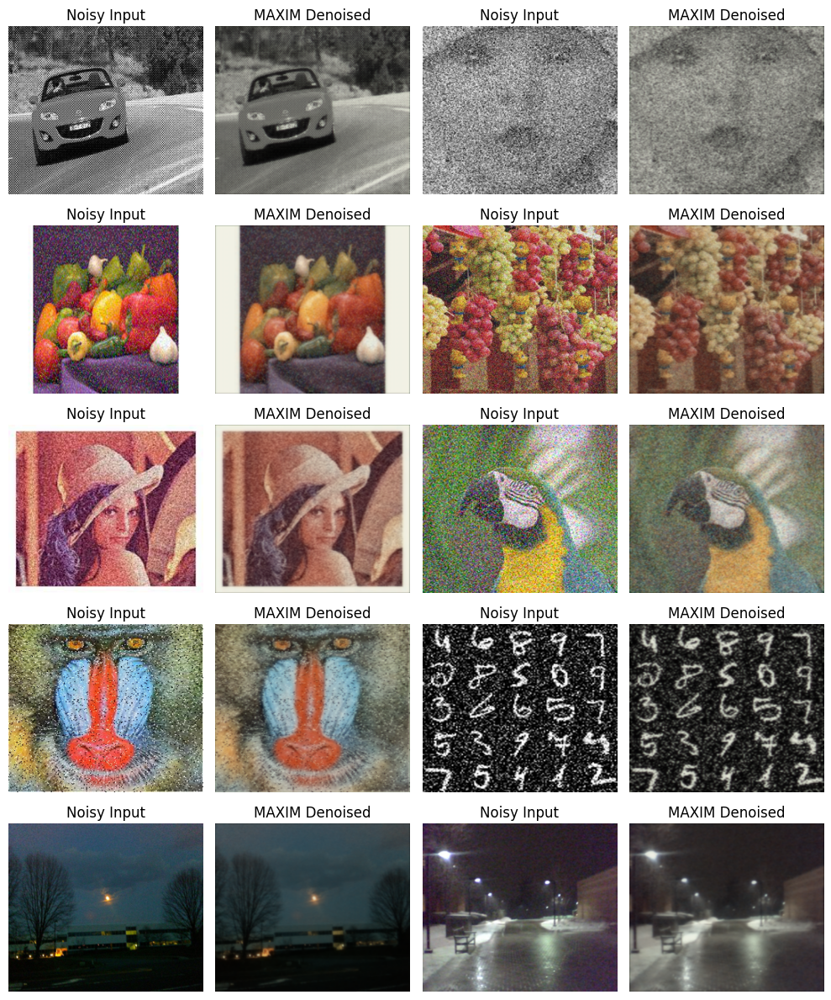

In [34]:
# Load a sample noisy image:
from glob import glob
plt.figure(figsize=(10, 12))
i = 1
for imf in sorted(glob('images/noisy/*.jpg')):
  #print(imf)
  im = Image.open(imf)
  im = im.resize((256, 256))
  im_np = np.array(im)
  # Prepare image tensor:
  im_tensor = tf.convert_to_tensor(im_np, dtype=tf.float32)
  im_tensor = tf.expand_dims(im_tensor, 0)  # batch = 1
  # Run denoising:
  denoised = model.predict(im_tensor)
  denoised[0][0].shape, denoised[0][1].shape, denoised[0][2].shape
  # Squeeze and convert back to uint8:
  denoised_np = tf.clip_by_value(denoised[0][2].squeeze(), 0, 255).numpy().astype(np.uint8)

  # Display input vs. output
  plt.subplot(5, 4, i)
  plt.imshow(im_np, aspect='auto'); plt.title("Noisy Input"); plt.axis("off")
  plt.subplot(5, 4, i+1)
  plt.imshow(denoised_np, aspect='auto'); plt.title("MAXIM Denoised"); plt.axis("off")
  i += 2
plt.tight_layout()
plt.show()

## Haze Removal using Dark Channel Prior

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.008608282..3.2941175].


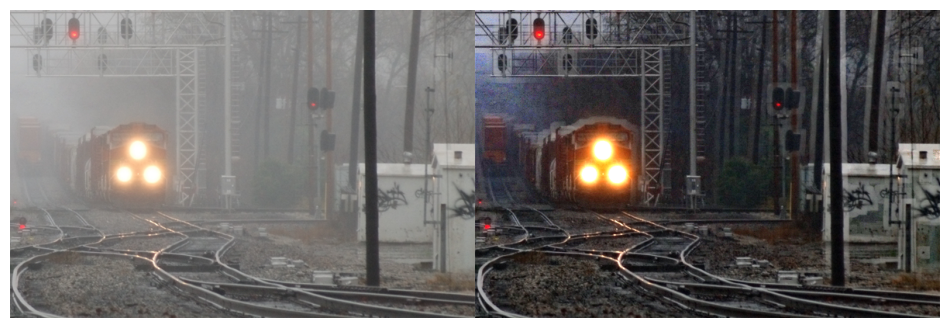

In [16]:
import cv2
import numpy as np

def dark_channel(im, sz):
    b, g, r = cv2.split(im)
    dc = cv2.min(cv2.min(r, g), b)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (sz, sz))
    dark = cv2.erode(dc, kernel)
    return dark

def estimate_atmospheric_light(im, dark):
    [h, w] = im.shape[:2]
    imsz = h * w
    numpx = int(max(np.floor(imsz / 1000), 1))
    darkvec = dark.reshape(imsz, 1)
    imvec = im.reshape(imsz, 3)

    indices = darkvec.argsort()
    indices = indices[imsz-numpx::]

    atmsum = np.zeros([1, 3])
    for ind in indices:
        atmsum = atmsum + imvec[ind]
    A = atmsum / numpx
    return A

def dehaze(im, A, omega=0.95, t0=0.1):
    im3 = np.empty(im.shape, im.dtype)

    for ind in range(0, 3):
        im3[:, :, ind] = im[:, :, ind] / A[0, ind]

    transmission = 1 - omega * dark_channel(im3, 15)

    #t = cv2.max(transmission, t0)
    t = np.maximum(transmission, t0)

    J = np.empty(im.shape, im.dtype)
    for ind in range(0, 3):
        J[:, :, ind] = (im[:, :, ind] - A[0, ind]) / t + A[0, ind]

    return J
    #return np.clip(J, 0, 255).astype(np.uint8)


# Example usage
img = plt.imread('images/train.png') #hazy.jpg
A = estimate_atmospheric_light(img, dark_channel(img, 15))
dehazed_img = dehaze(img, A)
#cv2.imwrite('images/output_dehazed.jpg', dehazed_img)
plt.figure(figsize=(12,5))
plt.imshow(np.hstack((img, dehazed_img))), plt.axis('off')
plt.show()

##  Super-Resolution with Enhanced Deep Residual Networks (EDSR)

In [3]:
# run in google colab
import tensorflow as tf
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

(90, 95, 3)
(360, 380, 3)
(360, 380, 3)


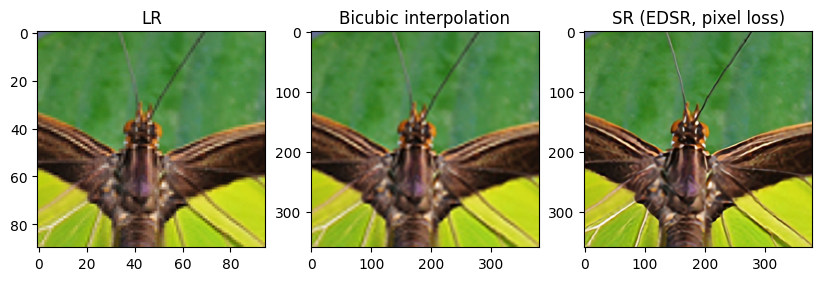

In [27]:
from tensorflow.keras.layers import Add, Conv2D, Input, Lambda
from tensorflow.keras.models import Model

DIV2K_RGB_MEAN = np.array([0.4488, 0.4371, 0.4040]) * 255

def edsr(scale, num_filters=64, num_res_blocks=8, res_block_scaling=None):
    """Creates an EDSR model."""
    x_in = Input(shape=(None, None, 3))
    x = Lambda(normalize)(x_in)

    x = b = Conv2D(num_filters, 3, padding='same')(x)
    for i in range(num_res_blocks):
        b = res_block(b, num_filters, res_block_scaling)
    b = Conv2D(num_filters, 3, padding='same')(b)
    x = Add()([x, b])

    x = upsample(x, scale, num_filters)
    x = Conv2D(3, 3, padding='same')(x)

    x = Lambda(denormalize)(x)
    return Model(x_in, x, name="edsr")

def res_block(x_in, filters, scaling):
    """Creates an EDSR residual block."""
    x = Conv2D(filters, 3, padding='same', activation='relu')(x_in)
    x = Conv2D(filters, 3, padding='same')(x)
    if scaling:
        x = Lambda(lambda t: t * scaling)(x)
    x = Add()([x_in, x])
    return x

def upsample(x, scale, num_filters):
    def upsample_1(x, factor, **kwargs):
        """Sub-pixel convolution."""
        x = Conv2D(num_filters * (factor ** 2), 3, padding='same', **kwargs)(x)
        return Lambda(pixel_shuffle(scale=factor))(x)

    if scale == 2:
        x = upsample_1(x, 2, name='conv2d_1_scale_2')
    elif scale == 3:
        x = upsample_1(x, 3, name='conv2d_1_scale_3')
    elif scale == 4:
        x = upsample_1(x, 2, name='conv2d_1_scale_2')
        x = upsample_1(x, 2, name='conv2d_2_scale_2')

    return x

def pixel_shuffle(scale):
    return lambda x: tf.nn.depth_to_space(x, scale)

def normalize(x):
    return (x - DIV2K_RGB_MEAN) / 127.5

def denormalize(x):
    return x * 127.5 + DIV2K_RGB_MEAN

def resolve_single(model, lr):
    return resolve(model, tf.expand_dims(lr, axis=0))[0]

def resolve(model, lr_batch):
    lr_batch = tf.cast(lr_batch, tf.float32)
    sr_batch = model(lr_batch)
    sr_batch = tf.clip_by_value(sr_batch, 0, 255)
    sr_batch = tf.round(sr_batch)
    sr_batch = tf.cast(sr_batch, tf.uint8)
    return sr_batch

def resolve_and_plot(model_pre_trained, lr_image_path):
    
    im_lr = Image.open(lr_image_path)
    lr = np.array(im_lr)[...,:3]

    sr_ci = np.array(im_lr.resize((lr.shape[1]*4,lr.shape[0]*4),Image.BICUBIC))[...,:3]
    sr_pt = resolve_single(model_pre_trained, lr)

    model_name = model_pre_trained.name.upper()

    images = [lr, sr_ci, sr_pt] #, sr_ft]
    titles = ['LR', 'Bicubic interpolation', f'SR ({model_name}, pixel loss)'] 
    positions = [1, 2, 3] #, 4]
    
    plt.figure(figsize=(10, 5))
    
    for i, (image, title, position) in enumerate(zip(images, titles, positions)):
        print(image.shape)
        plt.subplot(1, 3, position)
        plt.imshow(image)
        plt.title(title)
        # plt.xticks([]), plt.yticks([])

import os

weights_dir = 'models/'
lr_image_path = 'images/butterfly.png'

# EDSR baseline as described in the EDSR paper (1.52M parameters)
edsr_pre_trained = edsr(scale=4, num_res_blocks=16)
edsr_pre_trained.load_weights(os.path.join(weights_dir, 'weights-edsr-16-x4.h5'))

resolve_and_plot(edsr_pre_trained, lr_image_path)

## Questions

1. Use the `equalize()` function from `skimage.filters.rank` to implement local histogram equalization and compare it with the global histogram equalization from `skimage.exposure` module with a grayscale image.
2. Prove (using **law of large numbers**) and demonstrate that an image that can be recovered from a few noisy images (which are obtained by adding random zero-mean Gaussian noise to the original image), by simply taking the average of the noisy images. Does taking the median also work?
3. Implement **ordered dithering** (**halftoning**) using a **Bayer** threshold matrix. The goal is to convert a grayscale image into a black-and-white halftone version by comparing pixel intensities to values in a tiled matrix pattern. Here is what you need to do:
   * First understand the **Bayer Matrix**: begin with the $2\times 2$ Bayer matrix: $B=\begin{bmatrix}0 & 3 \\ 2 & 1\end{bmatrix}$. Normalize this matrix to values between 0 and 1 by using the formula: $T=\frac{B+0.5}{n^2}$, where $n$ is the matrix dimension (e.g., $2$ for $2\times 2$).
   * **Preprocess** the Image: Load a grayscale image and normalize its pixel values to the range $[0,1]$.
   * **Tile** the **Threshold Matrix**: Repeat the threshold matrix to match the size of the image (use tiling). Ensure that the matrix aligns spatially with the image pixels.
   * Apply the **Thresholding Rule**: For each pixel, compare its intensity with the corresponding threshold.
   * Set the output pixel to $1$ (white) if it's greater than the threshold, else $0$ (black).
   * Test and Display: Visualize both the original and the halftoned output side-by-side.
   * Try using larger **Bayer matrices** (e.g., $4\times 4$) for finer detail: Experiment with Bayer matrices of size $4\times 4$ or $8\times 8$ to observe how larger dithering patterns influence the visual smoothness and tone rendering.

    With $2\times 2$ Bayer matrix, you should obtain a figure like the following one:

    ![](images/halftone_bayer.png)

4. **Palette-Based Color Correction** in `P`-Mode `Image` Using `PIL`: You are provided with a `P`-mode image that contains a limited number of colors (typically $256$ or fewer). Some colors in the image appear visually inaccurate—such as skin tones appearing greenish or shadows being overly blue. Your task is to perform color correction by directly modifying the color palette of the image using the Python Imaging Library (`PIL`), without converting the image to RGB. Here is what you need to do:
    - Load a `P`-mode image using `PIL`.
    - Print and visualize the palette (e.g., display top $64$ color values from $256\times 3$ RGB values).
    - Identify one or more color entries in the palette that need correction (e.g., reddish tones).
    - Replace those color values in the palette with desired corrected colors (e.g., yellowish tones).
    - Apply the updated palette back to the image.
    - Display the original and corrected images side by side for comparison.

   You should obtain a figure like the following one:
   
   ![](images/col_pal_edit.png)